# Pre-processing - penguins Dataset

In [7]:
# Task 1: Import Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [21]:
# Task 2: Data frame
raw_data = pd.read_csv('penguins.csv')

In [23]:
# Task 2: Data frame
raw_data.head()

,species,island,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,gender,year
0,Adelie,Torgersen,6563,11,39.1,18.7,181.0,3750.0,male,2007.0
1,Adelie,Torgersen,4890,14,39.5,17.4,186.0,3800.0,female,2007.0
2,Adelie,Torgersen,7184,11,40.3,18.0,195.0,3250.0,female,2007.0
3,Adelie,Torgersen,4169,8,NaN,NaN,NaN,992.0,NaN,2007.0
4,Adelie,Torgersen,4774,8,36.7,19.3,193.0,3450.0,female,2007.0


In [25]:
# Task 2: Statistics
raw_data.describe()

,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,year
count,344.000000,344.000000,337.000000,333.000000,336.000000,339.000000,342.000000
mean,5270.002907,10.447674,45.494214,18.018318,197.764881,4175.463127,2008.035088
std,1067.959116,2.265895,10.815787,9.241384,27.764491,858.713267,0.816938
min,3504.000000,7.000000,32.100000,13.100000,10.000000,882.000000,2007.000000
25%,4403.000000,9.000000,39.500000,15.700000,190.000000,3550.000000,2007.000000
50%,5106.500000,10.000000,45.100000,17.300000,197.000000,4050.000000,2008.000000
75%,6212.750000,12.000000,49.000000,18.700000,213.000000,4750.000000,2009.000000
max,7197.000000,14.000000,124.300000,127.260000,231.000000,6300.000000,2009.000000


In [27]:
# Task 2: Data Frame info
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   species                 333 non-null    object 
 1   island                  334 non-null    object 
 2   calorie requirement     344 non-null    int64  
 3   average sleep duration  344 non-null    int64  
 4   bill_length_mm          337 non-null    float64
 5   bill_depth_mm           333 non-null    float64
 6   flipper_length_mm       336 non-null    float64
 7   body_mass_g             339 non-null    float64
 8   gender                  327 non-null    object 
 9   year                    342 non-null    float64
dtypes: float64(5), int64(2), object(3)
memory usage: 27.0+ KB


In [29]:
raw_data

,species,island,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,gender,year
0,Adelie,Torgersen,6563,11,39.1,18.7,181.0,3750.0,male,2007.0
1,Adelie,Torgersen,4890,14,39.5,17.4,186.0,3800.0,female,2007.0
2,Adelie,Torgersen,7184,11,40.3,18.0,195.0,3250.0,female,2007.0
3,Adelie,Torgersen,4169,8,NaN,NaN,NaN,992.0,NaN,2007.0
4,Adelie,Torgersen,4774,8,36.7,19.3,193.0,3450.0,female,2007.0
...,...,...,...,...,...,...,...,...,...,...
339,Chinstrap,Dream,4826,11,55.8,19.8,207.0,4000.0,male,2009.0
340,Chinstrap,Dream,4111,9,43.5,18.1,202.0,3400.0,female,2009.0
341,Chinstrap,Dream,7049,10,49.6,18.2,193.0,3775.0,male,2009.0
342,Chinstrap,Dream,4705,7,50.8,19.0,210.0,4100.0,male,2009.0


In [31]:
# Task 3: Handling Missing Values

df = raw_data.copy()

def calculate_median(col):
    sorted_col = sorted([value for value in col if value is not None])
    n = len(sorted_col)
    if n == 0:
        return None
    mid = n // 2
    return (sorted_col[mid] if n % 2 != 0 else (sorted_col[mid - 1] + sorted_col[mid]) / 2)

def calculate_mode(col):
    freq = {}
    for value in col:
        if value is not None:
            freq[value] = freq.get(value, 0) + 1
    return max(freq, key=freq.get) if freq else None

def fill_na(df):
    for col_name, col in df.items():
        if isinstance(col[0], (int, float, np.float64, np.int64)) or col[0] is None:
            median = calculate_median(col)
            fill_value = median
        else:
            fill_value = calculate_mode(col)
        df[col_name] = [fill_value if pd.isna(val) else val for val in col]

    return df

# Fill missing values in the dataset
df_filled = fill_na(df)

data = df_filled
data

,species,island,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,gender,year
0,Adelie,Torgersen,6563,11,39.10,18.7,181.0,3750.0,male,2007.0
1,Adelie,Torgersen,4890,14,39.50,17.4,186.0,3800.0,female,2007.0
2,Adelie,Torgersen,7184,11,40.30,18.0,195.0,3250.0,female,2007.0
3,Adelie,Torgersen,4169,8,46.85,13.2,202.5,992.0,male,2007.0
4,Adelie,Torgersen,4774,8,36.70,19.3,193.0,3450.0,female,2007.0
...,...,...,...,...,...,...,...,...,...,...
339,Chinstrap,Dream,4826,11,55.80,19.8,207.0,4000.0,male,2009.0
340,Chinstrap,Dream,4111,9,43.50,18.1,202.0,3400.0,female,2009.0
341,Chinstrap,Dream,7049,10,49.60,18.2,193.0,3775.0,male,2009.0
342,Chinstrap,Dream,4705,7,50.80,19.0,210.0,4100.0,male,2009.0


In [33]:
# Task 4: Handling String formats

def data_case_insensitive(data_case_sensitive):
    for column in data_case_sensitive.select_dtypes(include=['object']).columns:
        data_case_sensitive[column] = data_case_sensitive[column].str.lower()
    return data_case_sensitive

data_1 = data_case_insensitive(data)

In [35]:
# Task 5: Handling Outliers

def detect_outliers_in_column(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    score = Q3 - Q1
    bound_l = Q1 - 1.5*score
    bound_u = Q3 + 1.5*score
    median = column.median()
    column = np.where((column < bound_l) | (column > bound_u), median, column)

    return column

def detect_outliers_dataset(data_with_outliers):
    for column in data_with_outliers.select_dtypes(include=['float64','int64', 'int8']).columns:
        data_with_outliers[column]=detect_outliers_in_column(data_with_outliers[column])
    return data_with_outliers

data_2 = detect_outliers_dataset(data)
data_2

,species,island,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,gender,year
0,adelie,torgersen,6563.0,11.0,39.10,18.7,181.0,3750.0,male,2007.0
1,adelie,torgersen,4890.0,14.0,39.50,17.4,186.0,3800.0,female,2007.0
2,adelie,torgersen,7184.0,11.0,40.30,18.0,195.0,3250.0,female,2007.0
3,adelie,torgersen,4169.0,8.0,46.85,13.2,202.5,4050.0,male,2007.0
4,adelie,torgersen,4774.0,8.0,36.70,19.3,193.0,3450.0,female,2007.0
...,...,...,...,...,...,...,...,...,...,...
339,chinstrap,dream,4826.0,11.0,55.80,19.8,207.0,4000.0,male,2009.0
340,chinstrap,dream,4111.0,9.0,43.50,18.1,202.0,3400.0,female,2009.0
341,chinstrap,dream,7049.0,10.0,49.60,18.2,193.0,3775.0,male,2009.0
342,chinstrap,dream,4705.0,7.0,50.80,19.0,210.0,4100.0,male,2009.0


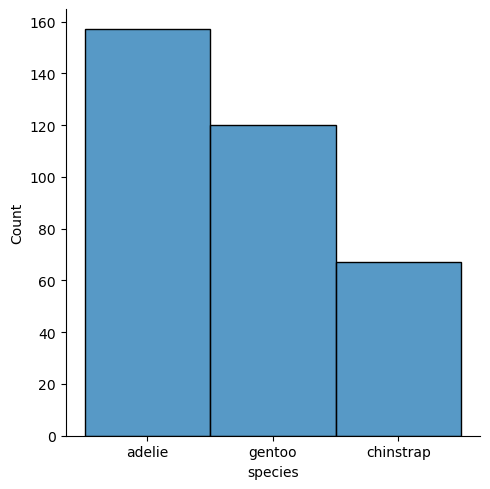

In [19]:
# Task 6: Data visualization

sns.displot(data=data_1, x="species")

[Text(0.5, 1.0, 'Detecting Outliers')]

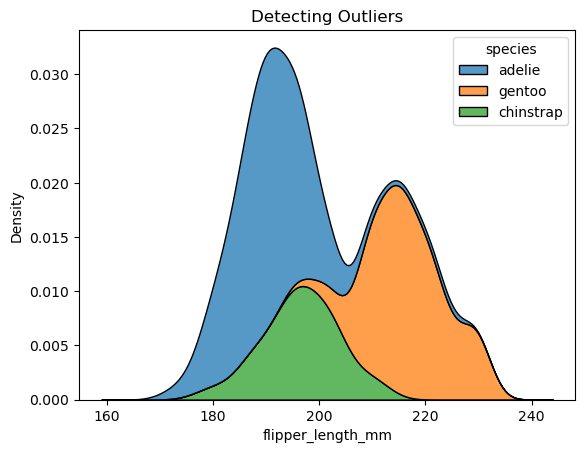

In [21]:
# Task 6: Data visualization

sns.kdeplot(data=data_1, x="flipper_length_mm", hue="species", multiple="stack").set(title='Detecting Outliers')

[Text(0.5, 1.0, 'Outlier free data')]

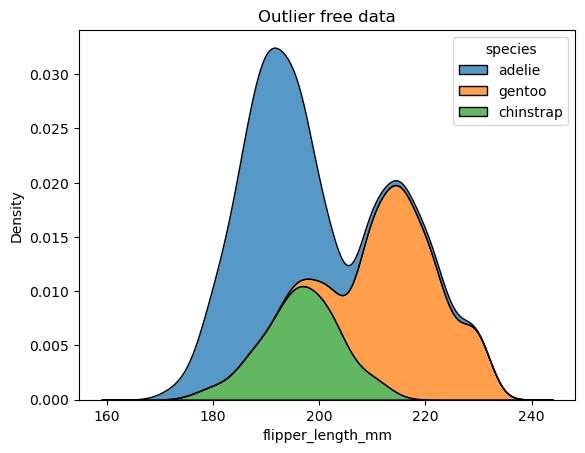

In [23]:
# Task 6: Data visualization

sns.kdeplot(data=data_2, x="flipper_length_mm", hue="species", multiple="stack").set(title='Outlier free data')

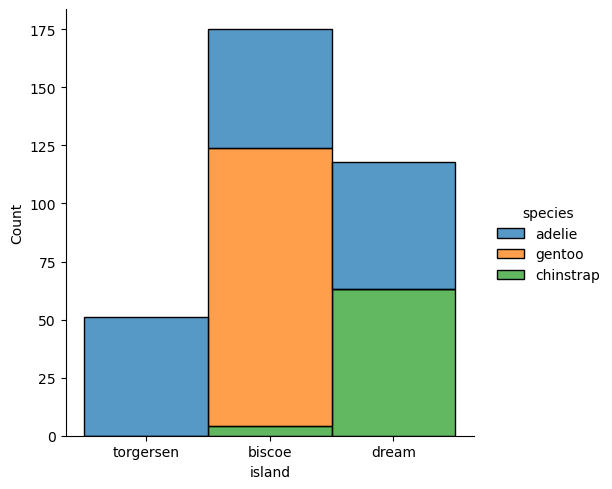

In [25]:
# Task 6: Data visualization

sns.displot(data=data_1, x="island", hue="species", multiple="stack")

In [37]:
# Task 8: Transform string to Categorical

data_2['species'] = pd.Categorical(data_2['species']).codes
data_2['island'] = pd.Categorical(data_2['island']).codes
data_2['gender'] = pd.Categorical(data_2['gender']).codes

data_2

,species,island,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,gender,year
0,0,2,6563.0,11.0,39.10,18.7,181.0,3750.0,1,2007.0
1,0,2,4890.0,14.0,39.50,17.4,186.0,3800.0,0,2007.0
2,0,2,7184.0,11.0,40.30,18.0,195.0,3250.0,0,2007.0
3,0,2,4169.0,8.0,46.85,13.2,202.5,4050.0,1,2007.0
4,0,2,4774.0,8.0,36.70,19.3,193.0,3450.0,0,2007.0
...,...,...,...,...,...,...,...,...,...,...
339,1,1,4826.0,11.0,55.80,19.8,207.0,4000.0,1,2009.0
340,1,1,4111.0,9.0,43.50,18.1,202.0,3400.0,0,2009.0
341,1,1,7049.0,10.0,49.60,18.2,193.0,3775.0,1,2009.0
342,1,1,4705.0,7.0,50.80,19.0,210.0,4100.0,1,2009.0


In [39]:
# Task 7: Plot function definition Identifying Correlation

def Plot_Correlation(data_set, name):
    matrix = data_set.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(matrix, annot=True, cmap='coolwarm')
    plt.title(f'Correlation Matrix Heatmap: {name}')
    plt.show()
    return matrix

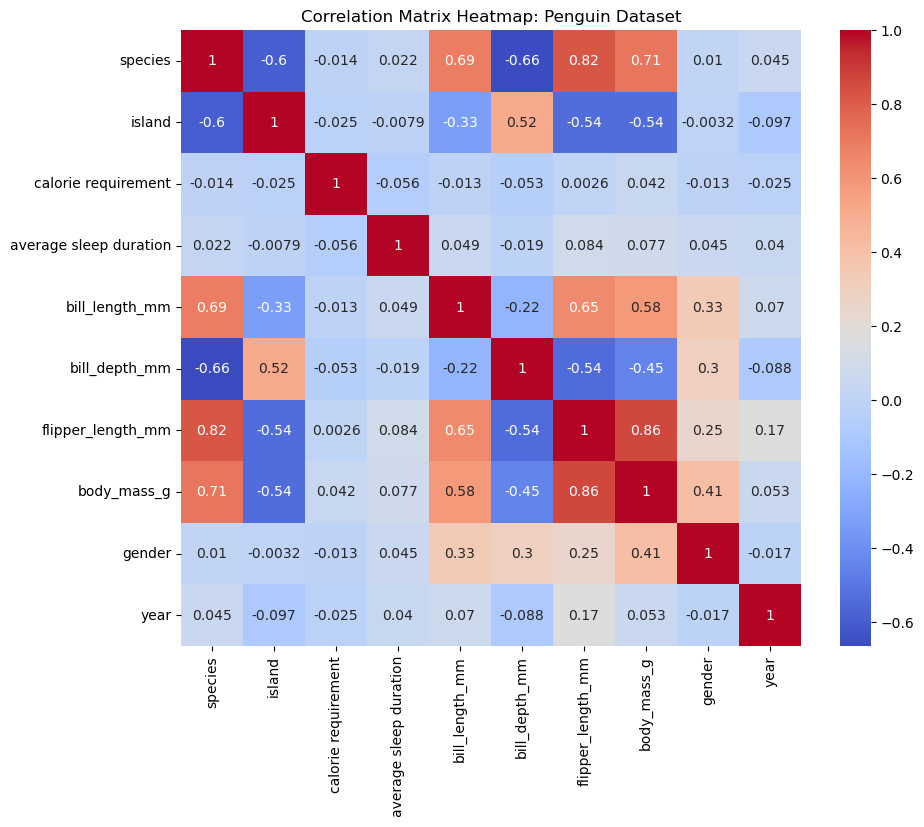

In [45]:
# Task 7: Correlation Plot

corr_matrix_penguin = Plot_Correlation(data_2, 'Penguin Dataset')

In [47]:
# Task 7: Identifying Correlated/Uncorrelated function definition
def uncorrelated_cols(matrix, col, filter):
    uncorrelated = []
    cols = matrix[col].sort_values(ascending=False)
    for i in range(len(cols)):
        if abs(cols[i]) < filter:
            uncorrelated.append(cols.keys()[i])
    return uncorrelated

In [49]:
# Task 7: Identifying Uncorrelated
uncorrelated_cols(corr_matrix_penguin, 'gender', 0.1)

/var/folders/ht/vhh4hxzn1614ncvj77svrnpr0000gn/T/ipykernel_18709/1827711445.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if abs(cols[i]) < filter:


['average sleep duration', 'species', 'island', 'calorie requirement', 'year']

In [51]:
# Task 9: Normalize Columns

def Normalize_column(column):
    min = column.min()
    max = column.max()
    return (column - min) / (max - min)

def Normalize_dataset(data_set):
    for column in data_set.columns:
        data_set[column] = Normalize_column(data_set[column])
    return data_set

print("Normalized DataFrame:")
data_3 = Normalize_dataset(data_2)
data_3

Normalized DataFrame:


,species,island,calorie requirement,average sleep duration,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,gender,year
0,0.0,1.0,0.828324,0.571429,0.254545,0.666667,0.152542,0.291667,1.0,0.0
1,0.0,1.0,0.375305,1.000000,0.269091,0.511905,0.237288,0.305556,0.0,0.0
2,0.0,1.0,0.996480,0.571429,0.298182,0.583333,0.389831,0.152778,0.0,0.0
3,0.0,1.0,0.180070,0.142857,0.536364,0.011905,0.516949,0.375000,1.0,0.0
4,0.0,1.0,0.343894,0.142857,0.167273,0.738095,0.355932,0.208333,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
339,0.5,0.5,0.357975,0.571429,0.861818,0.797619,0.593220,0.361111,1.0,1.0
340,0.5,0.5,0.164365,0.285714,0.414545,0.595238,0.508475,0.194444,0.0,1.0
341,0.5,0.5,0.959924,0.428571,0.636364,0.607143,0.355932,0.298611,1.0,1.0
342,0.5,0.5,0.325210,0.000000,0.680000,0.702381,0.644068,0.388889,1.0,1.0


In [121]:
# Save Dataset to CSV

data_3.to_csv('penguins_preprocessed.csv', index=False)

# Pre-processing -  Wine Dataset

In [53]:
# Task 2: Data frame
raw_data_redwine = pd.read_csv('winequality-red.csv', sep=";")
raw_data_whitewine = pd.read_csv('winequality-white.csv', sep=";")

In [55]:
# Task 2: Data frame
raw_data_redwine['type'] = 'red'
raw_data_whitewine['type'] = 'white'

In [57]:
# Task 2: Data frame Union
raw_data_wine = pd.concat([raw_data_whitewine, raw_data_redwine], ignore_index=True)

In [59]:
# Task 2: Dataset Stastics 
raw_data_wine.info()
raw_data_wine.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  type                  6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
type                    0
dtype: int64

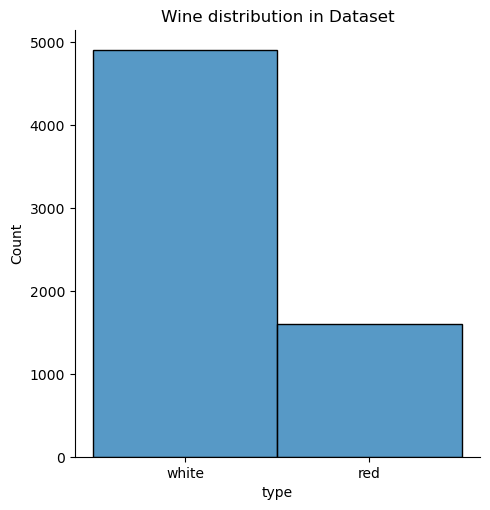

In [61]:
# Task 6: Data visualization

sns.displot(data=raw_data_wine, x="type").set(title='Wine distribution in Dataset')

In [50]:
# Task 2: Dataset Stastics 
raw_data_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


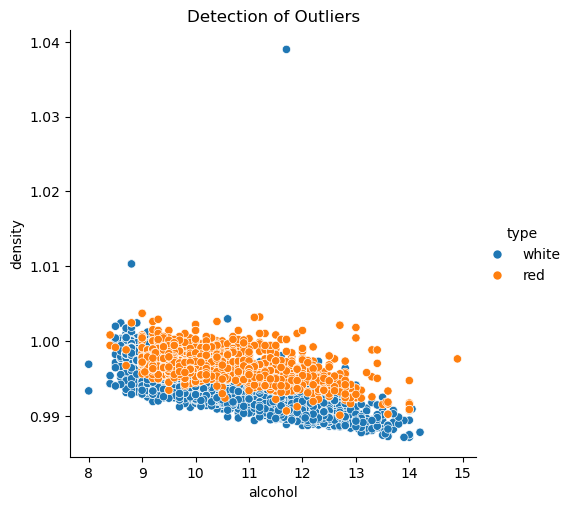

In [52]:
# Task 6: Data visualization

sns.relplot(data=raw_data_wine, y="density", x='alcohol', hue='type').set(title='Detection of Outliers')

[Text(0.5, 1.0, 'Detection of Outliers')]

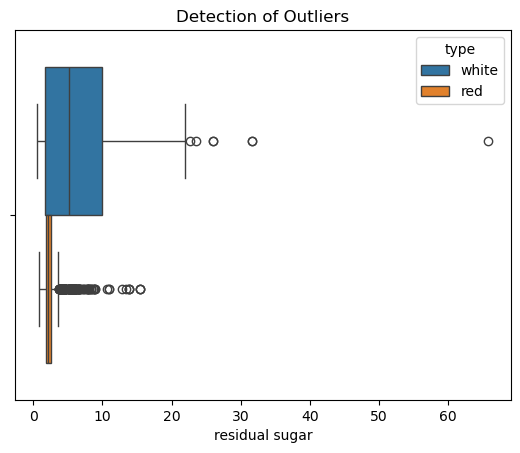

In [53]:
# Task 6: Data visualization

sns.boxplot(data=raw_data_wine, x='residual sugar', hue='type').set(title='Detection of Outliers')

### Plotting every possible plot to get any correllations

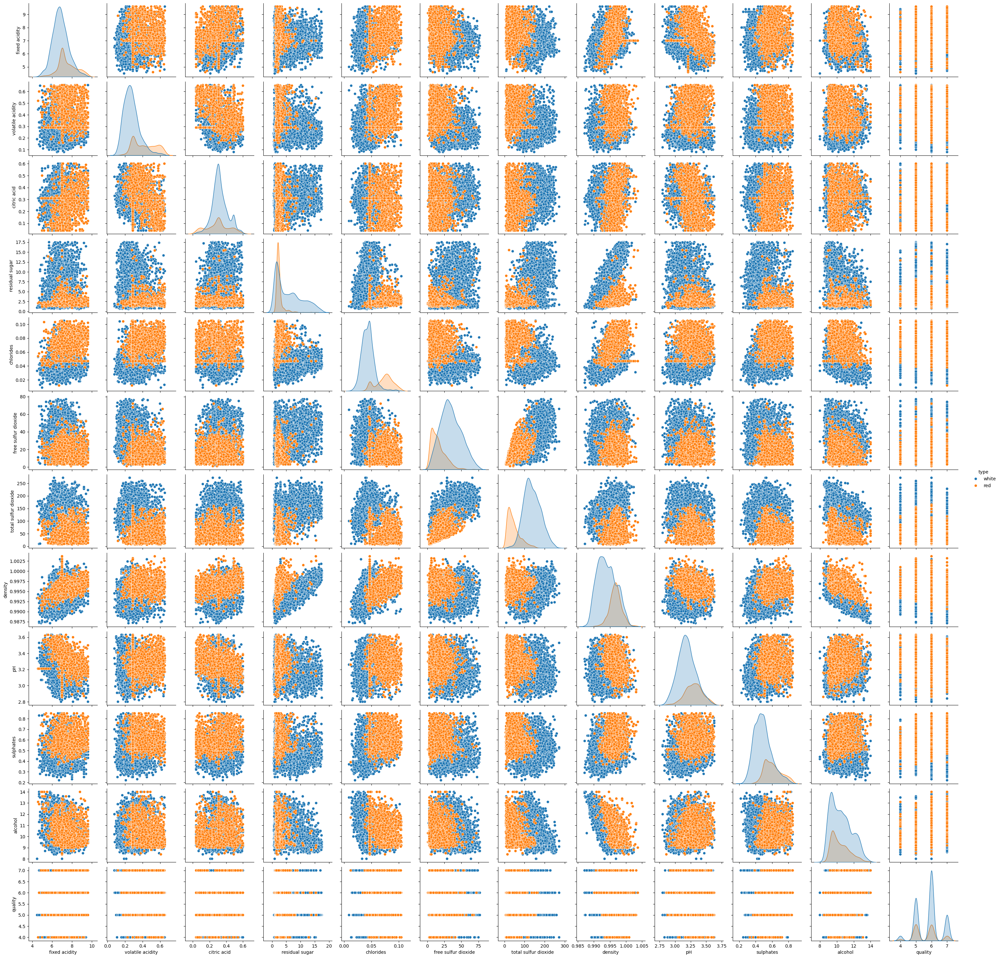

In [69]:
sns.pairplot(data=raw_data_wine, hue="type")

[Text(0.5, 1.0, 'Detecting Outliers')]

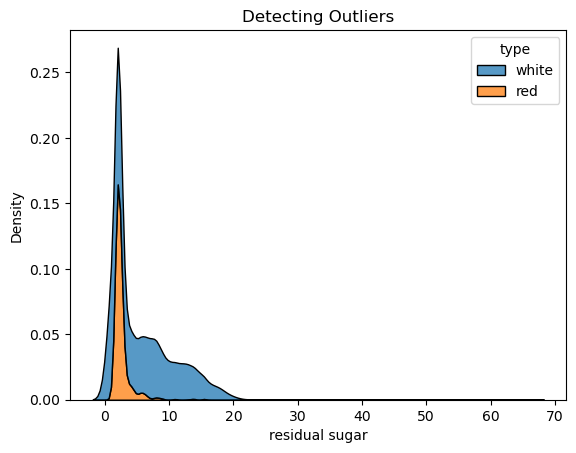

In [58]:
# Task 6: Data visualization

sns.kdeplot(data=raw_data_wine, x="residual sugar", hue="type", multiple="stack").set(title="Detecting Outliers")

[Text(0.5, 1.0, 'Detecting Outliers')]

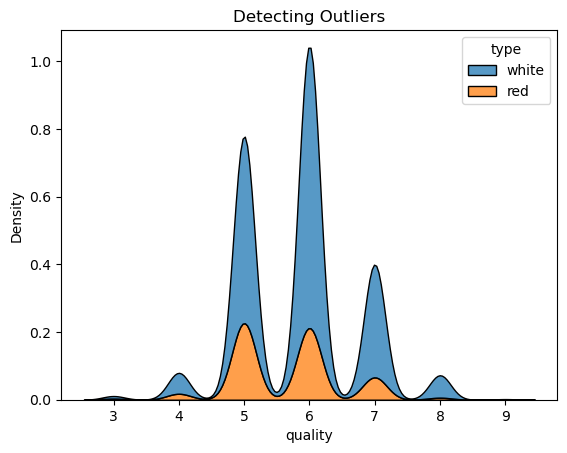

In [59]:
# Task 6: Data visualization

sns.kdeplot(data=raw_data_wine, x="quality", hue="type", multiple="stack").set(title="Detecting Outliers")

In [63]:
# Task 5: Handling Outliers

wine_data_olfree = detect_outliers_dataset(raw_data_wine)
wine_data_olfree

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.0,0.270,0.36,3.0,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6.0,white
1,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6.0,white
2,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6.0,white
3,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6.0,white
4,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6.0,white
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5.0,red
6493,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6.0,red
6494,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6.0,red
6495,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5.0,red


[Text(0.5, 1.0, 'Outlier Free')]

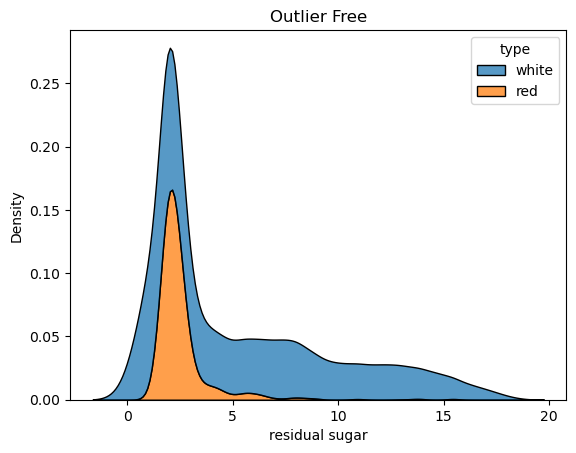

In [61]:
# Task 6: Data visualization

sns.kdeplot(data=wine_data_olfree, x="residual sugar", hue="type", multiple="stack").set(title="Outlier Free")

[Text(0.5, 1.0, 'Outlier Free')]

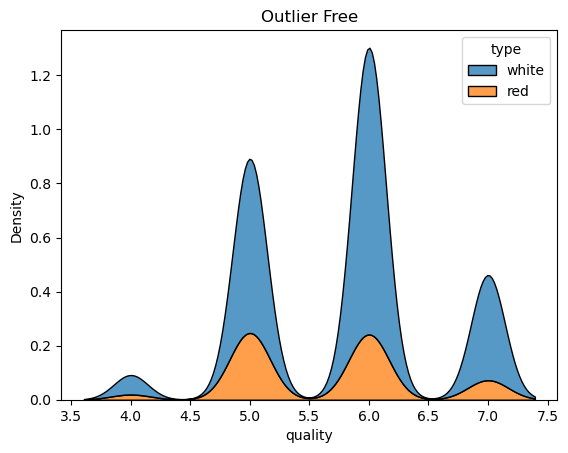

In [62]:
# Task 6: Data visualization

sns.kdeplot(data=wine_data_olfree, x="quality", hue="type", multiple="stack").set(title="Outlier Free")

In [67]:
# Task 8: One hot 

wine_data_encoded = pd.get_dummies(raw_data_wine, columns=['type'], drop_first=True)
wine_data_encoded.rename(columns={'type_white': 'type'}, inplace=True)
wine_data_encoded['type'] = wine_data_encoded['type'].astype(int)
wine_data_encoded

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.0,0.270,0.36,3.0,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6.0,1
1,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6.0,1
2,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6.0,1
3,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6.0,1
4,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5.0,0
6493,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6.0,0
6494,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6.0,0
6495,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5.0,0


**White wine** is marked as 1;
**Red wine** is marked as 0

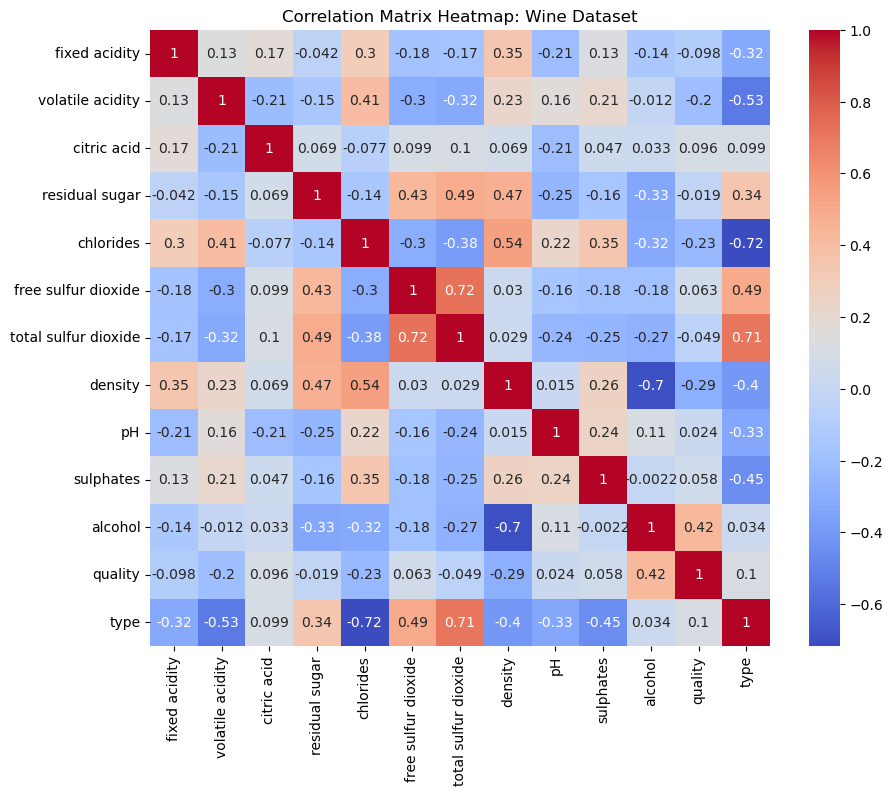

In [69]:
# Task 7: Identifying Correlation

corr_matrix = Plot_Correlation(wine_data_encoded, "Wine Dataset")

In [71]:
# Task 7: Identifying Correlation
print(corr_matrix['type'].sort_values(ascending=False))

type                    1.000000
total sulfur dioxide    0.706939
free sulfur dioxide     0.491837
residual sugar          0.344695
quality                 0.104120
citric acid             0.098863
alcohol                 0.033528
fixed acidity          -0.317101
pH                     -0.327431
density                -0.401345
sulphates              -0.448148
volatile acidity       -0.532417
chlorides              -0.716221
Name: type, dtype: float64


In [73]:
# Task 7: Identifying Uncorrelated rows
uncorrelated_cols(corr_matrix, 'type', 0.1)

/var/folders/ht/vhh4hxzn1614ncvj77svrnpr0000gn/T/ipykernel_18709/1827711445.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if abs(cols[i]) < filter:


['citric acid', 'alcohol']

In [67]:
# Task 9: Normalization
wine_data_normalized = Normalize_dataset(wine_data_encoded)
wine_data_normalized

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,0.490196,0.330435,0.571429,0.142012,0.375000,0.578947,0.616541,0.837756,0.240964,0.365079,0.133333,0.666667,1.0
1,0.352941,0.382609,0.535714,0.059172,0.416667,0.171053,0.473684,0.415561,0.602410,0.428571,0.250000,0.666667,1.0
2,0.705882,0.347826,0.642857,0.372781,0.427083,0.381579,0.342105,0.481906,0.554217,0.349206,0.350000,0.666667,1.0
3,0.529412,0.260870,0.500000,0.467456,0.510417,0.605263,0.676692,0.512063,0.469880,0.285714,0.316667,0.666667,1.0
4,0.529412,0.260870,0.500000,0.467456,0.510417,0.605263,0.676692,0.512063,0.469880,0.285714,0.316667,0.666667,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,0.333333,0.904348,0.071429,0.082840,0.843750,0.407895,0.142857,0.469843,0.783133,0.571429,0.416667,0.333333,0.0
6493,0.274510,0.817391,0.107143,0.094675,0.552083,0.500000,0.169173,0.483112,0.867470,0.857143,0.533333,0.666667,0.0
6494,0.352941,0.747826,0.160714,0.100592,0.697917,0.368421,0.127820,0.520507,0.746988,0.841270,0.500000,0.666667,0.0
6495,0.274510,0.982609,0.142857,0.082840,0.687500,0.407895,0.142857,0.504222,0.927711,0.777778,0.366667,0.333333,0.0


In [123]:
# Save Dataset to CSV

wine_data_normalized.to_csv('winequality_preprocessed.csv', index=False)

# Pre-processing - Diamond Dataset

In [129]:
# Task 2: Data frame
data_frame_diamond=pd.read_csv("diamond.csv")
print(data_frame_diamond)

      Unnamed: 0 carat        cut color clarity  average us salary  \
0              1  0.23      Ideal     E     SI2              31282   
1              2  0.21    Premium     E     SI1              40049   
2              3  0.23       Good     E     VS1              33517   
3              4  0.29    Premium     I     VS2              38495   
4              5  0.31       Good     J     SI2              34178   
...          ...   ...        ...   ...     ...                ...   
53935      53936  0.72      Ideal     D     SI1              43892   
53936      53937  0.72       Good     D     SI1              35532   
53937      53938   0.7  Very Good     D     SI1              32133   
53938      53939  0.86    Premium     H     SI2              44248   
53939      53940  0.75      Ideal     D     SI2              41412   

       number of diamonds mined (millions) depth table price     x     y     z  
0                                     5.01  61.5    55   326  3.95  3.98  2.43

In [131]:
# Task 2: Data frame
#By using head attribute we can display the first nth rows 
data_frame_diamond.head(10)

,Unnamed: 0,carat,cut,color,clarity,average us salary,number of diamonds mined (millions),depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,31282,5.01,61.5,55,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,40049,1.69,59.8,61,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,33517,3.85,56.9,65,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,38495,3.49,62.4,58,334,4.2,4.23,2.63
4,5,0.31,Good,J,SI2,34178,4.70,63.3,58,335,4.34,4.35,2.75
5,6,0.24,Very Good,J,VVS2,44700,0.86,62.8,57,336,3.94,3.96,2.48
6,7,0.24,Very Good,I,VVS1,42939,1.68,62.3,57,336,3.95,3.98,2.47
7,8,FALSE,NaN,H,SI1,37587,4.62,MAYBE,MAYBE,NaN,4.07,4.11,2.53
8,9,0.22,Fair,E,VS2,30454,4.02,65.1,61,337,3.87,3.78,2.49
9,10,0.23,Very Good,H,VS1,45506,1.20,59.4,61,338,4,4.05,2.39


In [133]:
# Task 2: Data frame
#we need to know the data in formation and data types of the data we are working on so we use .info
data_frame_diamond.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Unnamed: 0                           53563 non-null  object 
 1   carat                                52430 non-null  object 
 2   cut                                  52647 non-null  object 
 3   color                                52428 non-null  object 
 4   clarity                              53587 non-null  object 
 5   average us salary                    53940 non-null  int64  
 6   number of diamonds mined (millions)  53940 non-null  float64
 7   depth                                53246 non-null  object 
 8   table                                52398 non-null  object 
 9   price                                52357 non-null  object 
 10  x                                    52414 non-null  object 
 11  y                           

In [135]:
#as the column "Unnamed: 0" is just the index of the data and wouldnt be useful in the future process we drop the column 
data_frame_diamond=data_frame_diamond.drop('Unnamed: 0', axis=1)
data_frame_diamond.columns

Index(['carat', 'cut', 'color', 'clarity', 'average us salary',
       'number of diamonds mined (millions)', 'depth', 'table', 'price', 'x',
       'y', 'z'],
      dtype='object')

In [137]:
# Task 2: Data frame
data_frame_diamond.describe()

,average us salary,number of diamonds mined (millions)
count,53940.000000,53940.000000
mean,39521.990100,2.902669
std,5486.892971,1.325985
min,30000.000000,0.600000
25%,34780.000000,1.750000
50%,39547.500000,2.910000
75%,44252.000000,4.050000
max,48999.000000,5.200000


In [139]:
#prints the number of null values in each column of the data frame 
data_frame_diamond.isnull().sum()

carat                                  1510
cut                                    1293
color                                  1512
clarity                                 353
average us salary                         0
number of diamonds mined (millions)       0
depth                                   694
table                                  1542
price                                  1583
x                                      1526
y                                      1221
z                                      1433
dtype: int64

In [141]:
#there are invald enteries in the data set so we need to remove these invalid entries
invalid_entries = ['TRUE', 'FALSE', 'MAYBE']

#replacing all the invalid entries with null values  
data_frame_diamond = data_frame_diamond.replace(invalid_entries, pd.NA)

#select all the numeric columns from the data frame and replace all the null values in the column with mean value of the respective column  
num_columns = data_frame_diamond.select_dtypes(include=['float64', 'int64']).columns
data_frame_diamond.fillna({col: data_frame_diamond[col].mean() for col in num_columns}, inplace=True)

#select all the non numeric columns from the data frame and replace all the null values in the column with most repeated value of the respective column that is mode of the coloumn 
non_num_columns= data_frame_diamond.select_dtypes(include=['object']).columns
data_frame_diamond.fillna({col: data_frame_diamond[col].mode()[0] for col in non_num_columns}, inplace=True)

data_frame_diamond_1 = data_frame_diamond.copy()

In [143]:
#we check the null value count after replacing all the null values with mean and mode 
data_frame_diamond_1.isnull().sum()

carat                                  0
cut                                    0
color                                  0
clarity                                0
average us salary                      0
number of diamonds mined (millions)    0
depth                                  0
table                                  0
price                                  0
x                                      0
y                                      0
z                                      0
dtype: int64

In [145]:
# Task 4: Handling String formats
#we convert all the non numeric coloums to lower case 
data_frame_diamond_1['cut'] = data_frame_diamond_1['cut'].str.lower()
data_frame_diamond_1['color'] = data_frame_diamond_1['color'].str.lower()
data_frame_diamond_1['clarity'] = data_frame_diamond_1['clarity'].str.lower()

In [147]:
data_frame_diamond_1.head()

,carat,cut,color,clarity,average us salary,number of diamonds mined (millions),depth,table,price,x,y,z
0,0.23,ideal,e,si2,31282,5.01,61.5,55,326,3.95,3.98,2.43
1,0.21,premium,e,si1,40049,1.69,59.8,61,326,3.89,3.84,2.31
2,0.23,good,e,vs1,33517,3.85,56.9,65,327,4.05,4.07,2.31
3,0.29,premium,i,vs2,38495,3.49,62.4,58,334,4.2,4.23,2.63
4,0.31,good,j,si2,34178,4.70,63.3,58,335,4.34,4.35,2.75


In [149]:
# Task 5: Handling Outliers
#selecting the numeric columns from the data frame 
numerical_columns = data_frame_diamond_1.select_dtypes(include=['float64', 'int64']).columns

#function to replace all the  numeric data with mean values 
def outliers(data_frame_diamond_1, column):
    Q1 = data_frame_diamond_1[column].quantile(0.25)
    Q3 = data_frame_diamond_1[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    mean_value = data_frame_diamond_1[column].mean()
    data_frame_diamond_1[column] = data_frame_diamond_1[column].apply(lambda x: mean_value if x < lower_bound or x > upper_bound else x)
    return data_frame_diamond_1


for column in numerical_columns:
    data_frame_diamond_1 = outliers(data_frame_diamond_1, column)

data_frame_diamond_1.head()


,carat,cut,color,clarity,average us salary,number of diamonds mined (millions),depth,table,price,x,y,z
0,0.23,ideal,e,si2,31282,5.01,61.5,55,326,3.95,3.98,2.43
1,0.21,premium,e,si1,40049,1.69,59.8,61,326,3.89,3.84,2.31
2,0.23,good,e,vs1,33517,3.85,56.9,65,327,4.05,4.07,2.31
3,0.29,premium,i,vs2,38495,3.49,62.4,58,334,4.2,4.23,2.63
4,0.31,good,j,si2,34178,4.70,63.3,58,335,4.34,4.35,2.75


In [151]:
#convert "carat","price " columns to numeric
data_frame_diamond_1['carat'] = pd.to_numeric(data_frame_diamond_1['carat'], errors='coerce')
data_frame_diamond_1['price'] = pd.to_numeric(data_frame_diamond_1['price'], errors='coerce')

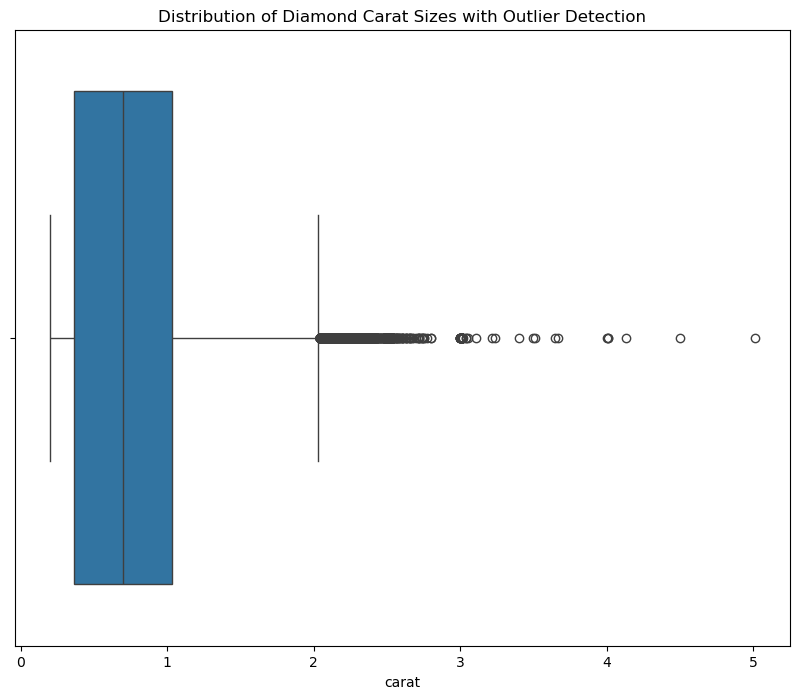

In [153]:
# Task 6: Data visualization
plt.figure(figsize=(10,8))
sns.boxplot(x='carat', data=data_frame_diamond_1)
plt.title('Distribution of Diamond Carat Sizes with Outlier Detection')
plt.show()

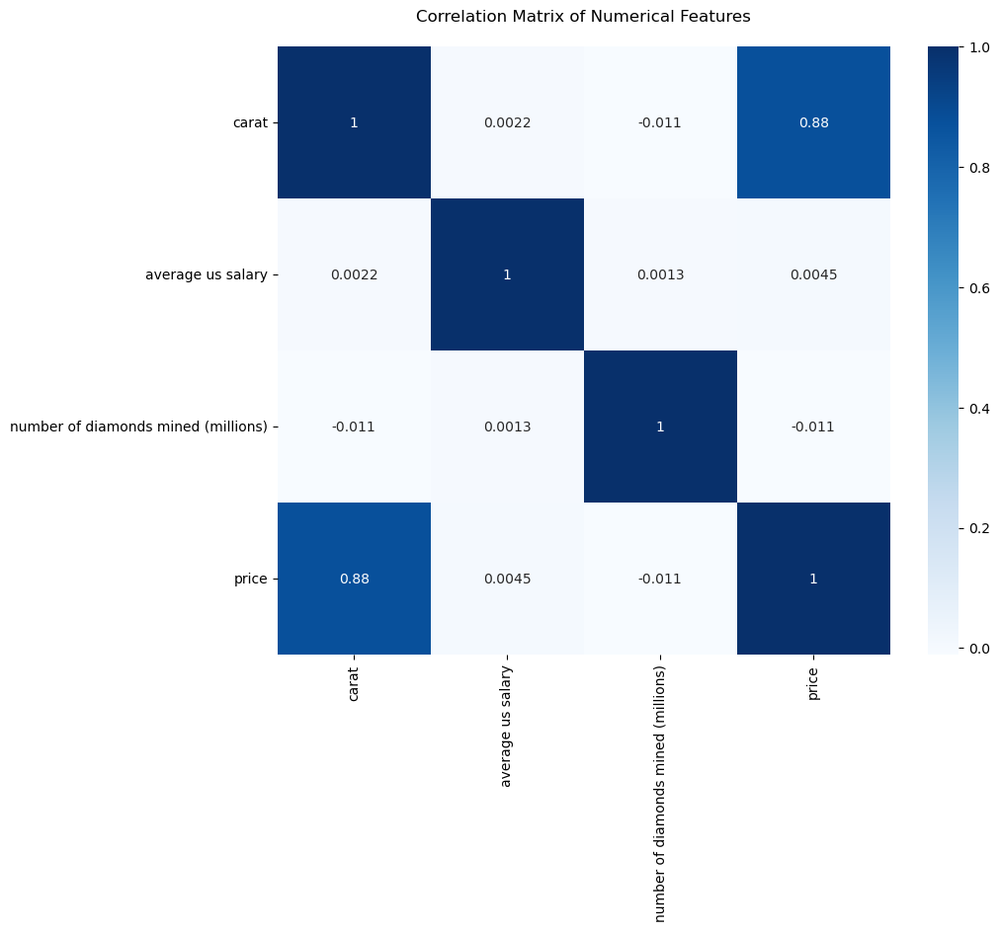

In [155]:
# Task 6: Data visualization
plt.figure(figsize=(10, 8))

numeric_columns = data_frame_diamond_1.select_dtypes(include=['float64', 'int64'])
corr_matrix = numeric_columns.corr()
sns.heatmap(corr_matrix, annot=True, cmap='Blues')
plt.title('Correlation Matrix of Numerical Features\n')
plt.show()

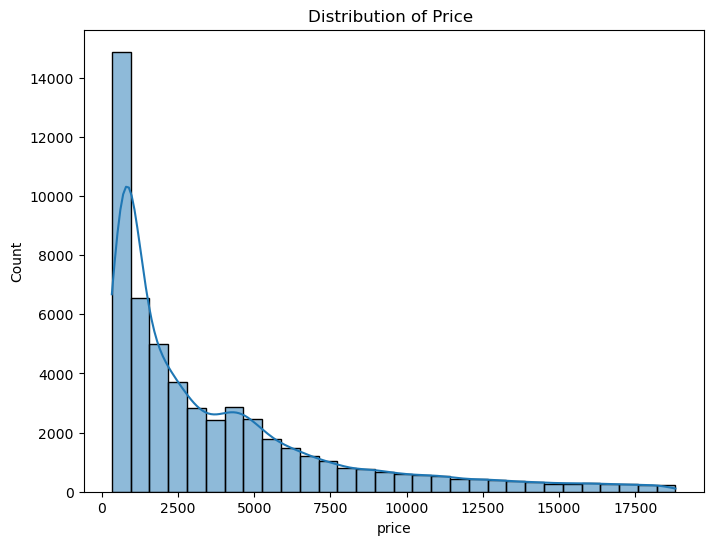

In [157]:
# Task 6: Data visualization
plt.figure(figsize=(8, 6))
sns.histplot(data_frame_diamond_1['price'], bins=30, kde=True)
plt.title('Distribution of Price ')
plt.show()

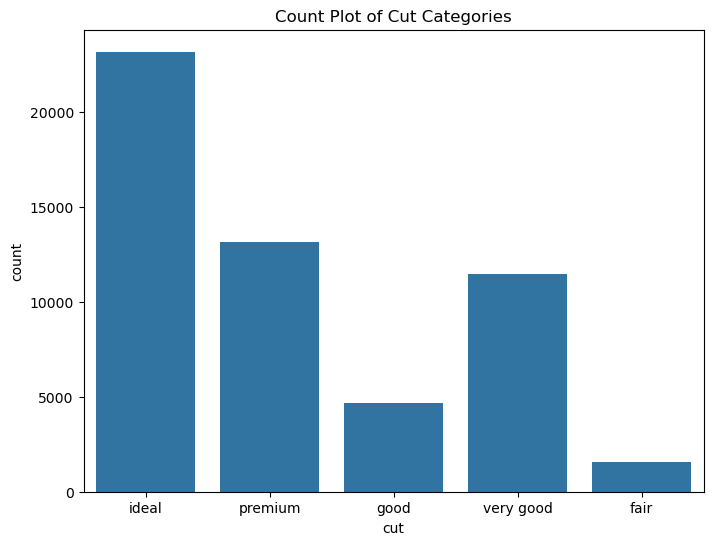

In [159]:
# Task 6: Data visualization
plt.figure(figsize=(8, 6))
sns.countplot(x='cut', data=data_frame_diamond_1)
plt.title('Count Plot of Cut Categories')
plt.show()

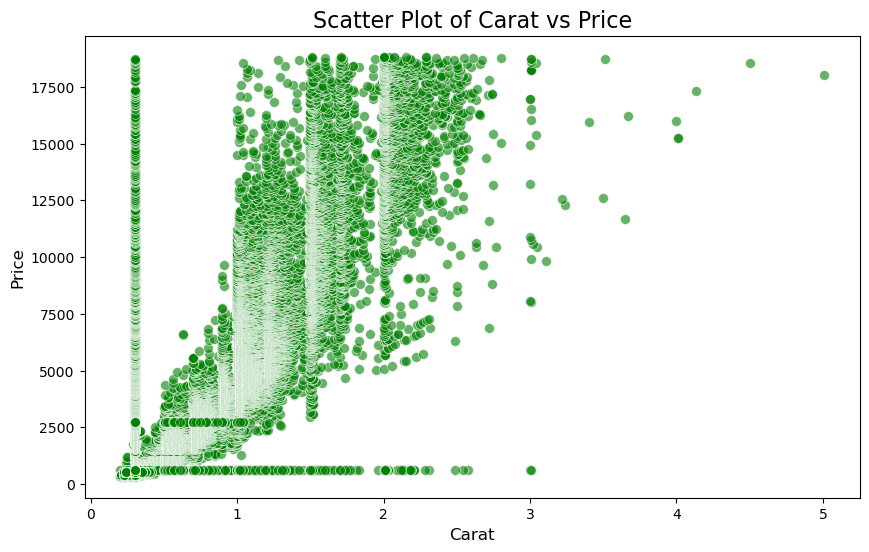

In [161]:
# Task 6: Data visualization
plt.figure(figsize=(10, 6))

sns.scatterplot(data=data_frame_diamond_1, x='carat', y='price', alpha=0.6, s=50, color='green')

plt.title("Scatter Plot of Carat vs Price", fontsize=16)
plt.xlabel("Carat", fontsize=12)
plt.ylabel("Price", fontsize=12)

plt.show()

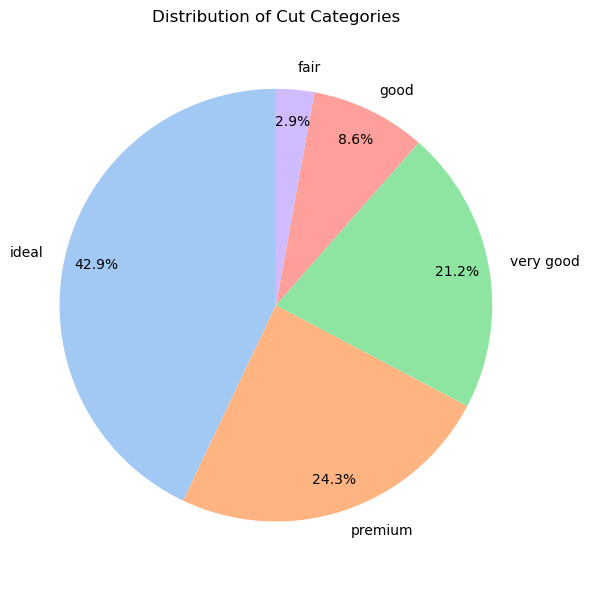

In [163]:
# Task 6: Data visualization
cut_counts = data_frame_diamond_1['cut'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(cut_counts, labels=cut_counts.index, autopct='%1.1f%%', startangle=90, 
        colors=sns.color_palette('pastel'), pctdistance=0.85)
plt.title('Distribution of Cut Categories')
plt.axis('equal')
plt.tight_layout()
plt.show()


In [165]:
# Task 7: Plot function definition Identifying Correlation
for col in data_frame_diamond_1.select_dtypes(include=['object']).columns:
    data_frame_diamond_1[col] = pd.Categorical(data_frame_diamond_1[col]).codes
matrix = data_frame_diamond_1.corr()
correlation = matrix['cut'].sort_values(ascending=False)
print("Correlation value of feature vs cut:\n", correlation)
threshold = 0.02
low = correlation[correlation.abs() < threshold].index
data_frame_diamond_1 = data_frame_diamond_1.drop(columns=low)
print(f"\n low correlation columns:{list(low)}")

Correlation value of feature vs cut:
 cut                                    1.000000
table                                  0.180074
price                                  0.047320
y                                      0.038818
x                                      0.038676
clarity                                0.035349
carat                                  0.031366
z                                      0.015287
average us salary                      0.001916
number of diamonds mined (millions)    0.001913
color                                 -0.005366
depth                                 -0.194196
Name: cut, dtype: float64

 low correlation columns:['z', 'average us salary', 'number of diamonds mined (millions)', 'color']


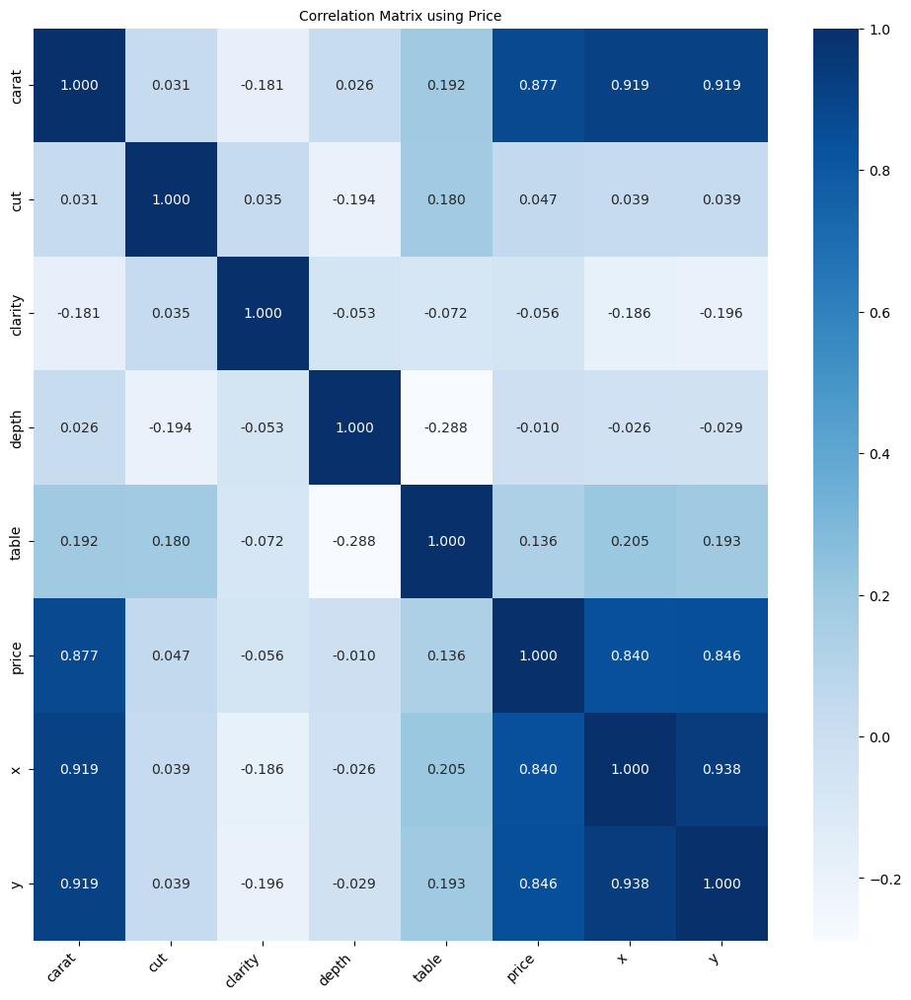

In [167]:
plt.figure(figsize=(12, 12))
sns.heatmap(data_frame_diamond_1.corr(), cmap='Blues', annot=True, fmt=".3f")
plt.title("Correlation Matrix using Price", size=10)
plt.xticks(rotation=45, ha='right')
plt.show()

In [169]:
# Task 8: Transform string to Categorical
data_frame_diamond_1['cut'] = pd.Categorical(data_frame_diamond_1['cut']).codes
data_frame_diamond_1['clarity'] = pd.Categorical(data_frame_diamond_1['clarity']).codes
data_frame_diamond_1

,carat,cut,clarity,depth,table,price,x,y
0,0.23,2,3,83,29,326,26,28
1,0.21,3,2,66,89,326,20,14
2,0.23,1,4,37,113,327,36,38
3,0.29,3,5,92,59,334,51,54
4,0.31,1,3,101,59,335,65,66
...,...,...,...,...,...,...,...,...
53935,0.72,2,2,76,49,2757,206,207
53936,0.72,1,2,99,29,2757,200,206
53937,0.70,4,2,96,79,2757,197,199
53938,0.86,3,3,78,59,2757,246,244


In [171]:
# Task 9: Normalizing data 
non_categorical_columns = data_frame_diamond_1.select_dtypes(exclude=['category']).columns

min_values = data_frame_diamond_1[non_categorical_columns].min()
max_values = data_frame_diamond_1[non_categorical_columns].max()

data_frame_diamond_normalized = data_frame_diamond_1.copy()
data_frame_diamond_normalized[non_categorical_columns] = (data_frame_diamond_normalized[non_categorical_columns] - min_values) / (max_values - min_values)
data_frame_diamond_normalized.head()

,carat,cut,clarity,depth,table,price,x,y
0,0.006237,0.50,0.428571,0.453552,0.235772,0.000000,0.047101,0.051095
1,0.002079,0.75,0.285714,0.360656,0.723577,0.000000,0.036232,0.025547
2,0.006237,0.25,0.571429,0.202186,0.918699,0.000054,0.065217,0.069343
3,0.018711,0.75,0.714286,0.502732,0.479675,0.000433,0.092391,0.098540
4,0.022869,0.25,0.428571,0.551913,0.479675,0.000487,0.117754,0.120438


In [173]:
# Save Dataset to CSV

data_frame_diamond_normalized.to_csv('diamond_preprocessed.csv', index=False)

### References

https://seaborn.pydata.org/tutorial/relational.html

https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.fillna.html

https://numpy.org/numpy-tutorials/

Assignment_0 final submission

https://www.geeksforgeeks.org/hyperparameter-tuning/

https://www.geeksforgeeks.org/ml-handling-missing-values/

https://www.geeksforgeeks.org/detect-and-remove-the-outliers-using-python/

https://www.geeksforgeeks.org/ml-feature-scaling-part-2/

https://www.geeksforgeeks.org/ml-one-hot-encoding/

https://www.geeksforgeeks.org/python-data-visualization-tutorial/

https://www.geeksforgeeks.org/data-preprocessing-machine-learning-python/

https://neptune.ai/blog/data-preprocessing-guide

https://www.kaggle.com/code/alirezahasannejad/data-preprocessing-in-machine-learning